# Galactic models comparison

In [1]:
from healpy.newvisufunc import projview
from healpy.rotator import Rotator
import healpy as hp
import traceback

from pygdsm import (
    GlobalSkyModel2016,
    GlobalSkyModel,
    LowFrequencySkyModel,
    HaslamSkyModel,
)
from pylfmap import LFmap

import pandas as pd
import numpy as np
from scipy.integrate import quad
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import itertools

import plotly.graph_objects as go
import plotly.express as px

import os
import sys
from radiocalibrationtoolkit import *

[INFO] LFmap: Import successful.


In [2]:
# This ensures Plotly output works in multiple places:
# plotly_mimetype: VS Code notebook UI
# notebook: "Jupyter: Export to HTML" command in VS Code
# See https://plotly.com/python/renderers/#multiple-renderers
import plotly.io as pio
pio.renderers.default = "plotly_mimetype+notebook"

In [3]:
# some global plot settings
plt.rcParams["axes.titleweight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
plt.rcParams["font.weight"] = "bold"
plt.rcParams['font.size'] = 16
plt.rcParams['legend.fontsize']= 14

plt.rcParams['xtick.major.width']= 2
plt.rcParams['ytick.major.width']= 2

plt.rcParams['xtick.major.size']= 5
plt.rcParams['ytick.major.size']= 5

plt.rcParams['xtick.labelsize']= 14
plt.rcParams['ytick.labelsize']= 14

In [4]:
# Prepare objects
lfmap = LFmap()
lfss = LowFrequencySkyModel(freq_unit="MHz")
gsm2008 = GlobalSkyModel(freq_unit="MHz")
gsm2016 = GlobalSkyModel2016(freq_unit="MHz")
haslam = HaslamSkyModel(freq_unit="MHz", spectral_index=-2.53)
ssm = SSM()
gmoss = GMOSS()
ulsa_fdi = ULSA(index_type='freq_dependent_index')
ulsa_ci = ULSA(index_type='constant_index')
ulsa_dpi = ULSA(index_type='direction_dependent_index')

[INFO] Available frequencies are:
['10.0', '100.0', '101.0', '102.0', '103.0', '104.0', '105.0', '106.0', '107.0', '108.0', '109.0', '11.0', '110.0', '111.0', '112.0', '113.0', '114.0', '115.0', '116.0', '117.0', '118.0', '119.0', '12.0', '120.0', '121.0', '122.0', '123.0', '124.0', '13.0', '14.0', '15.0', '16.0', '17.0', '18.0', '19.0', '20.0', '21.0', '22.0', '23.0', '24.0', '25.0', '26.0', '27.0', '28.0', '29.0', '30.0', '30.1', '30.2', '30.3', '30.4', '30.5', '30.6', '30.7', '30.8', '30.9', '31.0', '31.1', '31.2', '31.3', '31.4', '31.5', '31.6', '31.7', '31.8', '31.9', '32.0', '32.1', '32.2', '32.3', '32.4', '32.5', '32.6', '32.7', '32.8', '32.9', '33.0', '33.1', '33.2', '33.3', '33.4', '33.5', '33.6', '33.7', '33.8', '33.9', '34.0', '34.1', '34.2', '34.3', '34.4', '34.5', '34.6', '34.7', '34.8', '34.9', '35.0', '35.1', '35.2', '35.3', '35.4', '35.5', '35.6', '35.7', '35.8', '35.9', '36.0', '36.1', '36.2', '36.3', '36.4', '36.5', '36.6', '36.7', '36.8', '36.9', '37.0', '37.1', '37.

In [5]:
frequency_MHz = 45

lfmap_map = lfmap.generate(frequency_MHz)
lfss_map = lfss.generate(frequency_MHz)
gsm2008_map = gsm2008.generate(frequency_MHz)
gsm2016_map = gsm2016.generate(frequency_MHz)
haslam_map = haslam.generate(frequency_MHz)
ssm_map = ssm.generate(frequency_MHz)
gmoss_map = gmoss.generate(frequency_MHz)
ulsa_fdi_map = ulsa_fdi.generate(frequency_MHz)
ulsa_ci_map = ulsa_ci.generate(frequency_MHz)
ulsa_dpi_map = ulsa_dpi.generate(frequency_MHz)

[INFO] Outputing map at 45.0 MHz


In [6]:
# Check size of the arrays and NSIDE number and angular resolution

map_list = [lfmap_map, lfss_map, gsm2008_map, gsm2016_map, haslam_map, ssm_map, gmoss_map, ulsa_fdi_map, ulsa_ci_map, ulsa_dpi_map]
[print_map_properties(m) for m in map_list]

49152 64 0.9161297098179749
786432 256 0.22903242745449373
3145728 512 0.11451621372724687
12582912 1024 0.05725810686362343
3145728 512 0.11451621372724687
49152 64 0.9161297098179749
3072 16 3.6645188392718997
49152 64 0.9161297098179749
12288 32 1.8322594196359498
12288 32 1.8322594196359498


[None, None, None, None, None, None, None, None, None, None]

In [7]:
# convert to same NSIDE, NSIDE is always some power of two
new_nside = 64
lfmap_map_N = hp.ma(hp.pixelfunc.ud_grade(lfmap_map, new_nside))
lfss_map_N = hp.ma(hp.pixelfunc.ud_grade(lfss_map, new_nside))
gsm2008_map_N = hp.ma(hp.pixelfunc.ud_grade(gsm2008_map, new_nside))
gsm2016_map_N = hp.ma(hp.pixelfunc.ud_grade(gsm2016_map, new_nside))
ssm_map_N = hp.ma(hp.pixelfunc.ud_grade(ssm_map, new_nside))
haslam_map_N = hp.ma(hp.pixelfunc.ud_grade(haslam_map, new_nside))
gmoss_map_N = hp.ma(hp.pixelfunc.ud_grade(gmoss_map, new_nside))
ulsa_fdi_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_fdi_map, new_nside))
ulsa_ci_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_ci_map, new_nside))
ulsa_dpi_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_dpi_map, new_nside))

In [8]:
integrate_hpmap(gmoss_map_N+2.75)/integrate_hpmap(gmoss_map_N)

1.0003563453462547

In [9]:
map_dict = {
    "LFSS": lfss_map_N,
    "GSM08": gsm2008_map_N,
    "GSM16": gsm2016_map_N,
    "Haslam": haslam_map_N,
    "LFmap": lfmap_map_N,
    "SSM": ssm_map_N,
    "GMOSS": gmoss_map_N,
    "ULSA": ulsa_fdi_map_N,
    # "ULSA2": ulsa_ci_map_N,
    # "ULSA3": ulsa_dpi_map_N,
}

ulsa_map_dict = {
    "ULSA FDI": ulsa_fdi_map_N,
    "ULSA CI": ulsa_ci_map_N,
    "ULSA DPI": ulsa_dpi_map_N,
}


In [10]:
# Print the maps in the dictionary
[(key, map_dict[key]) for key in map_dict]

[('LFSS',
  masked_array(data=[6227.78764597, 6102.85349076, 6071.39988092, ...,
                     5664.5046081 , 5533.42382158, 5606.74671447],
               mask=False,
         fill_value=-1.6375e+30)),
 ('GSM08',
  masked_array(data=[4267.97014572, 3819.72189502, 3662.01733267, ...,
                     3603.73014558, 3720.16569487, 3608.65983489],
               mask=False,
         fill_value=-1.6375e+30)),
 ('GSM16',
  masked_array(data=[5463.913 , 5372.2   , 5301.0835, ..., 5816.875 ,
                     5815.23  , 5870.9053],
               mask=False,
         fill_value=-1.6375e+30,
              dtype=float32)),
 ('Haslam',
  masked_array(data=[4253.95079958, 4200.77365683, 4176.65689163, ...,
                     4621.56378236, 4640.03107866, 4703.16874133],
               mask=False,
         fill_value=-1.6375e+30)),
 ('LFmap',
  masked_array(data=[6642.74952513, 4647.79983773, 4762.51349167, ...,
                     4721.59683248, 4761.13456047, 4799.49011505],
  

## Galactic coordinates

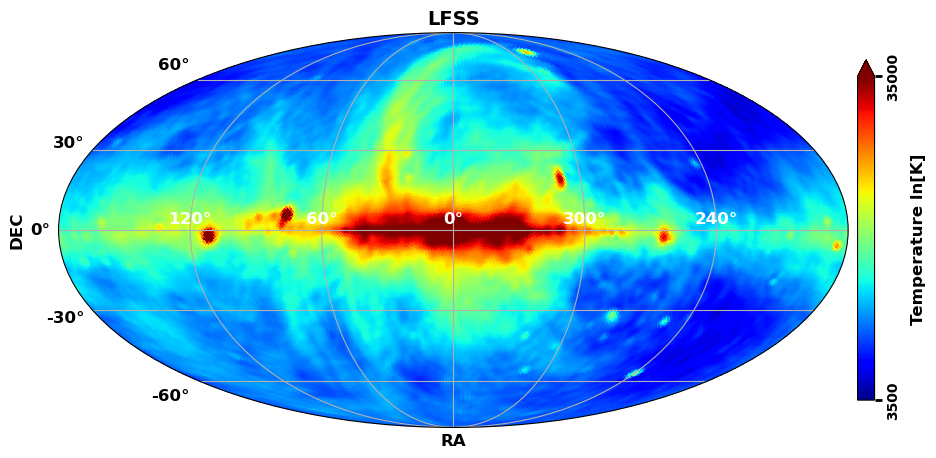

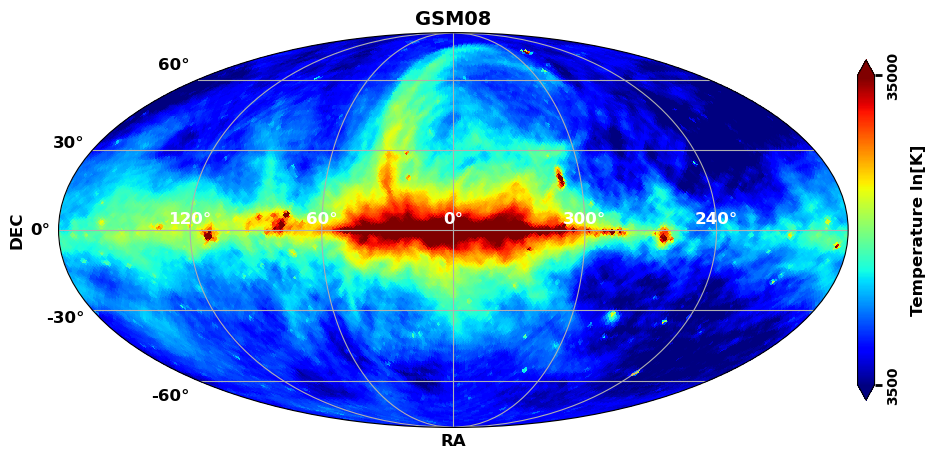

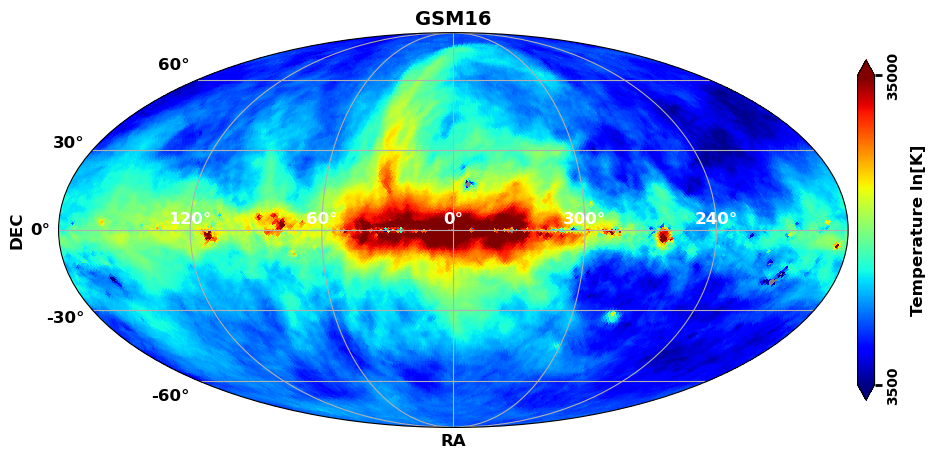

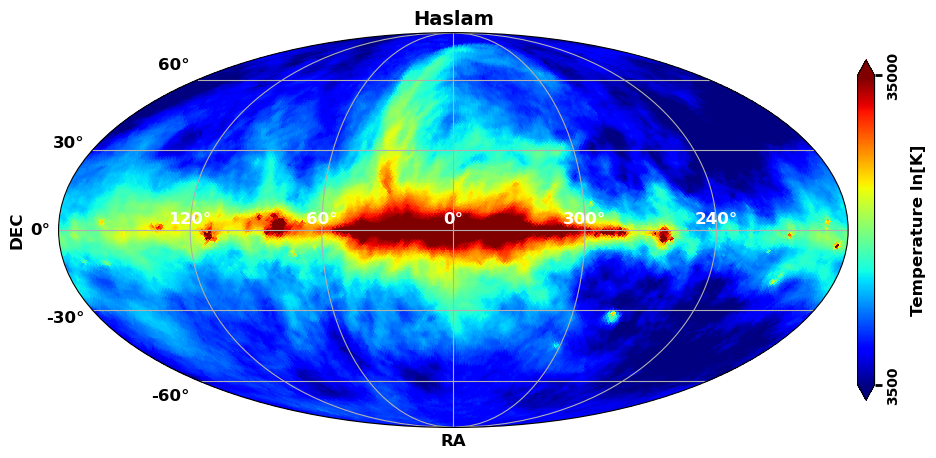

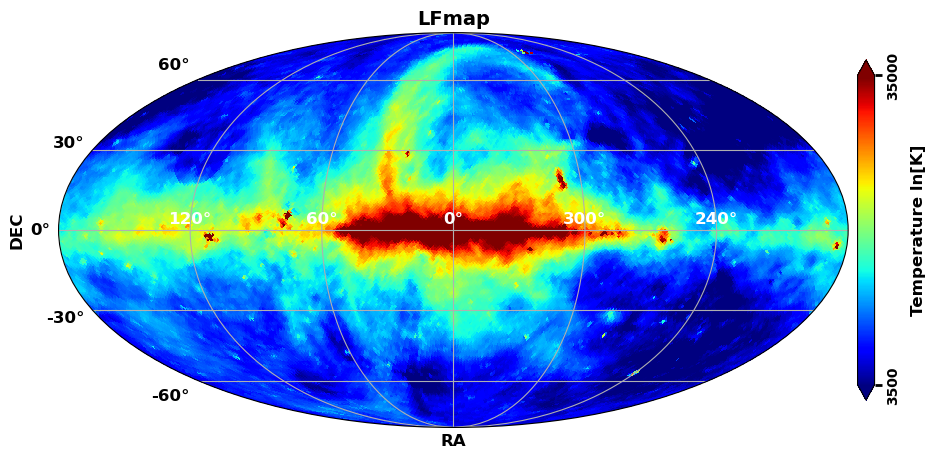

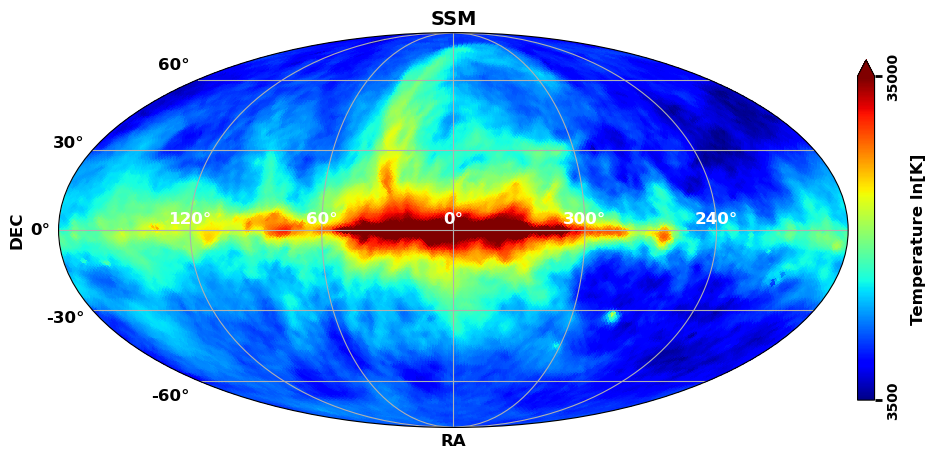

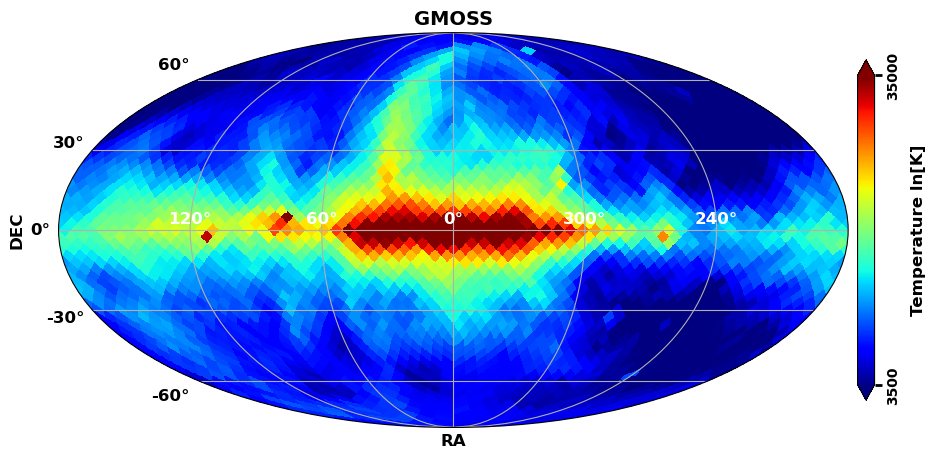

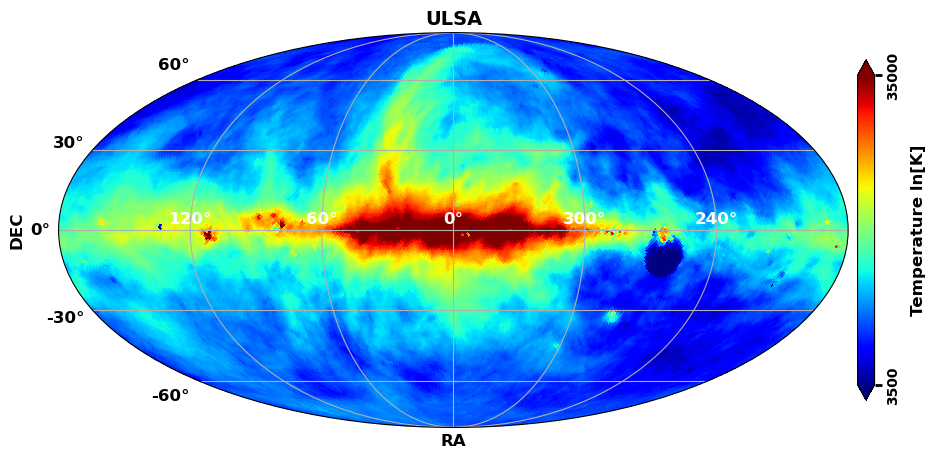

In [11]:
# Prints all maps
cmap = "jet"
projection_type = "mollweide"

for key in map_dict:

    projview(
        map_dict[key],
        norm="log",
        coord=["G"],
        graticule=True,
        graticule_labels=True,
        unit="Temperature ln[K]",
        xlabel="RA",
        ylabel="DEC",
        cb_orientation="vertical",
        min=3500,
        max=35000,
        latitude_grid_spacing=30,
        projection_type=projection_type,
        title=key,
        xtick_label_color="white",
        cmap=cmap,
    )

{'LFSS/GSM08': [1.11],
 'LFSS/GSM16': [1.02],
 'LFSS/Haslam': [1.05],
 'LFSS/LFmap': [1.05],
 'LFSS/SSM': [1.04],
 'LFSS/GMOSS': [1.14],
 'LFSS/ULSA': [1.02],
 'GSM08/GSM16': [0.92],
 'GSM08/Haslam': [0.95],
 'GSM08/LFmap': [0.94],
 'GSM08/SSM': [0.94],
 'GSM08/GMOSS': [1.03],
 'GSM08/ULSA': [0.92],
 'GSM16/Haslam': [1.03],
 'GSM16/LFmap': [1.03],
 'GSM16/SSM': [1.02],
 'GSM16/GMOSS': [1.12],
 'GSM16/ULSA': [0.99],
 'Haslam/LFmap': [1.0],
 'Haslam/SSM': [0.99],
 'Haslam/GMOSS': [1.09],
 'Haslam/ULSA': [0.96],
 'LFmap/SSM': [0.99],
 'LFmap/GMOSS': [1.09],
 'LFmap/ULSA': [0.97],
 'SSM/GMOSS': [1.1],
 'SSM/ULSA': [0.98],
 'GMOSS/ULSA': [0.89]}

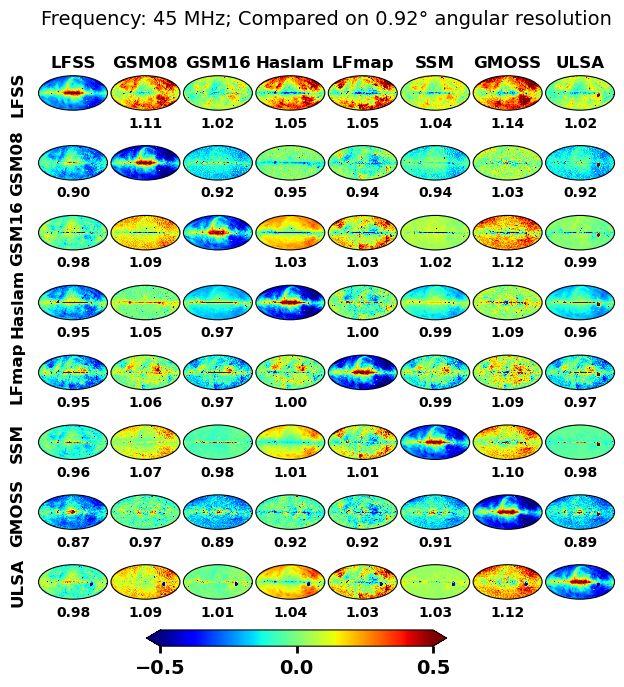

In [12]:
compare_maps(
    map_dict,
    main_title="Frequency: {} MHz; Compared on {:.2f}{} angular resolution".format(
        frequency_MHz, np.rad2deg(hp.pixelfunc.nside2resol(new_nside)), chr(176)
    ),
)

{'ULSA FDI/ULSA CI': [1.0],
 'ULSA FDI/ULSA DPI': [0.99],
 'ULSA CI/ULSA DPI': [0.99]}

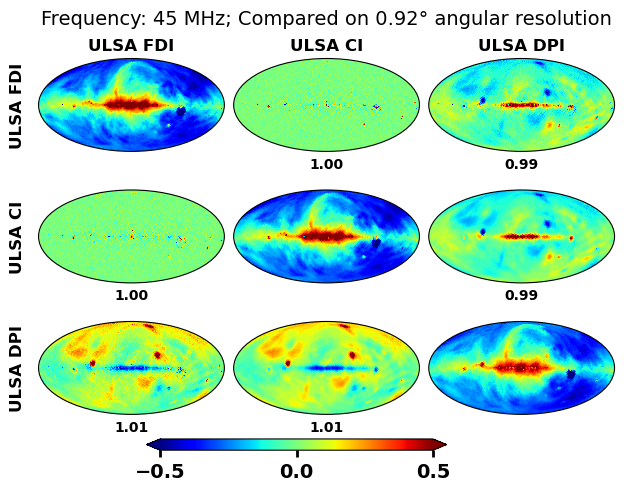

In [13]:
compare_maps(
    ulsa_map_dict,
    main_title="Frequency: {} MHz; Compared on {:.2f}{} angular resolution".format(
        frequency_MHz, np.rad2deg(hp.pixelfunc.nside2resol(new_nside)), chr(176)
    ),
    figsize=(6, 4.5)
)

### Compare at all frequencies

In [14]:
f_range = range(30, 85, 5)
for frequency_MHz in f_range:
    # LFmap is by default in Celestial coordinates, to make things simpler, we rotate it to Galactic coordinates at the creation stage.
    lfmap_map = hp.rotator.Rotator.rotate_map_pixel(
        Rotator(coord=["C", "G"]), lfmap.generate(frequency_MHz)
    )
    lfmap_map = lfmap.generate(frequency_MHz)
    lfss_map = lfss.generate(frequency_MHz)
    gsm2008_map = gsm2008.generate(frequency_MHz)
    gsm2016_map = gsm2016.generate(frequency_MHz)
    haslam_map = haslam.generate(frequency_MHz)
    ssm_map = ssm.generate(frequency_MHz)
    gmoss_map = gmoss.generate(frequency_MHz)
    ulsa_fdi_map = ulsa_fdi.generate(frequency_MHz)
    ulsa_ci_map = ulsa_ci.generate(frequency_MHz)
    ulsa_dpi_map = ulsa_dpi.generate(frequency_MHz)

    # convert to same NSIDE
    new_nside = 64
    lfmap_map_N = hp.ma(hp.pixelfunc.ud_grade(lfmap_map, new_nside))
    lfss_map_N = hp.ma(hp.pixelfunc.ud_grade(lfss_map, new_nside))
    gsm2008_map_N = hp.ma(hp.pixelfunc.ud_grade(gsm2008_map, new_nside))
    gsm2016_map_N = hp.ma(hp.pixelfunc.ud_grade(gsm2016_map, new_nside))
    ssm_map_N = hp.ma(hp.pixelfunc.ud_grade(ssm_map, new_nside))
    haslam_map_N = hp.ma(hp.pixelfunc.ud_grade(haslam_map, new_nside))
    gmoss_map_N = hp.ma(hp.pixelfunc.ud_grade(gmoss_map, new_nside))
    ulsa_fdi_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_fdi_map, new_nside))
    ulsa_ci_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_ci_map, new_nside))
    ulsa_dpi_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_dpi_map, new_nside))

    map_temp_dict = {
        "LFSS": lfss_map_N,
        "GSM08": gsm2008_map_N,
        "GSM16": gsm2016_map_N,
        "Haslam": haslam_map_N,
        "LFmap": lfmap_map_N,
        "SSM": ssm_map_N,
        "GMOSS": gmoss_map_N,
        "ULSA": ulsa_fdi_map_N,
        # "ULSA2": ulsa_ci_map_N,
        # "ULSA3": ulsa_dpi_map_N,
    }


    compare_dict = compare_maps(
        map_temp_dict,
        show_plot_comparison=False,
        verbose=False
    )

    if frequency_MHz == list(f_range)[0]:
        compare_DF = pd.DataFrame(compare_dict).T
        compare_DF.columns = [list(f_range)[0]]
    else:
        compare_DF[frequency_MHz] = pd.DataFrame(compare_dict).T.values

[INFO] Outputing map at 30.0 MHz
[INFO] Outputing map at 30.0 MHz


[INFO] Outputing map at 35.0 MHz
[INFO] Outputing map at 35.0 MHz


[INFO] Outputing map at 40.0 MHz
[INFO] Outputing map at 40.0 MHz


[INFO] Outputing map at 45.0 MHz
[INFO] Outputing map at 45.0 MHz


[INFO] Outputing map at 50.0 MHz
[INFO] Outputing map at 50.0 MHz


[INFO] Outputing map at 55.0 MHz
[INFO] Outputing map at 55.0 MHz


[INFO] Outputing map at 60.0 MHz
[INFO] Outputing map at 60.0 MHz


[INFO] Outputing map at 65.0 MHz
[INFO] Outputing map at 65.0 MHz


[INFO] Outputing map at 70.0 MHz
[INFO] Outputing map at 70.0 MHz


[INFO] Outputing map at 75.0 MHz
[INFO] Outputing map at 75.0 MHz


[INFO] Outputing map at 80.0 MHz
[INFO] Outputing map at 80.0 MHz


In [15]:
fig = px.imshow(
    compare_DF,
    width=500,
    height=600,
    color_continuous_scale="jet",
    zmin=0.7,
    zmax=1.3,
    labels={"x": "<b>frequency [MHz]</b>"},
)
fig.update_layout(
    margin=dict(l=20, r=120, t=20, b=20),
    xaxis={"nticks": 5},
    font=dict(family="Arial Black", size=15, color="black"),
)
fig.update_yaxes(tickprefix="<b>", ticksuffix="</b>")
fig.update_xaxes(
    tickprefix="<b>", ticksuffix="</b>", tick0=30, dtick=10, tickfont=dict(size=18)
)

fig.update_coloraxes(
    colorbar=dict(
        tickprefix="<b>",
        ticksuffix="</b>",
        tickfont=dict(size=18),
    )
)

fig.add_annotation(
    go.layout.Annotation(
        text='<b>Integrated ratio</b>',
        x=1.4,
        y=0.5,
        xref='paper',
        yref='paper',
        showarrow=False,
        font=dict(size=18),
        textangle=-90,
        align='center',
        valign='middle',
    )
)

fig.show()

Text(0, 0.5, '<IR>$_{\\mathrm{models}}$')

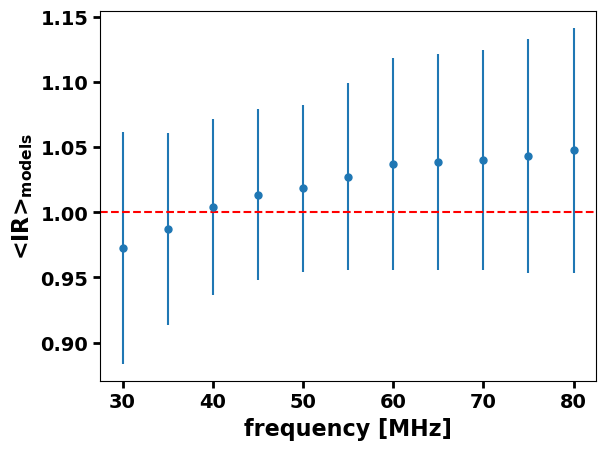

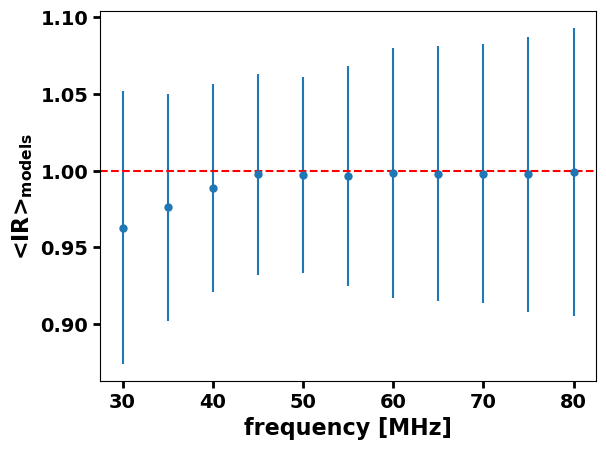

In [16]:
fig, ax = plt.subplots()

# temp = compare_DF.std(axis=0)
labels = compare_DF.columns.astype(float)
ax.errorbar(
    labels,
    compare_DF.mean(axis=0).values,
    yerr=compare_DF.std(axis=0),
    marker=".",
    linestyle="",
    markersize=10,
)

ax.axes.axhline(1, ls="--", c="r")
ax.set_xlabel("frequency [MHz]")
ax.set_ylabel("<IR>$_{\mathrm{models}}$")

fig, ax = plt.subplots()


ax.errorbar(
    labels,
    compare_DF.iloc[7:,:].mean(axis=0).values,
    yerr=compare_DF.std(axis=0),
    marker=".",
    linestyle="",
    markersize=10,
)


ax.axes.axhline(1, ls="--", c="r")
ax.set_xlabel("frequency [MHz]")
ax.set_ylabel("<IR>$_{\mathrm{models}}$")

In [17]:
compare_DF.iloc[12:,:]

,30,35,40,45,50,55,60,65,70,75,80
GSM08/ULSA,0.83,0.87,0.90,0.92,0.93,0.94,0.95,0.96,0.96,0.97,0.98
GSM16/Haslam,0.92,0.96,1.00,1.03,1.03,1.02,1.02,1.01,1.01,1.00,1.00
GSM16/LFmap,0.97,0.99,1.01,1.03,1.01,0.99,0.98,0.97,0.96,0.96,0.95
GSM16/SSM,0.93,0.96,0.99,1.02,1.01,1.00,1.00,0.99,0.99,0.98,0.98
GSM16/GMOSS,1.06,1.08,1.10,1.12,1.10,1.09,1.07,1.06,1.05,1.04,1.04
GSM16/ULSA,0.90,0.93,0.97,0.99,0.99,0.98,0.98,0.97,0.97,0.96,0.96
Haslam/LFmap,1.05,1.03,1.01,1.00,0.98,0.97,0.97,0.96,0.96,0.95,0.95
Haslam/SSM,1.01,1.00,0.99,0.99,0.99,0.98,0.98,0.98,0.98,0.98,0.98
Haslam/GMOSS,1.15,1.12,1.10,1.09,1.07,1.06,1.06,1.05,1.04,1.04,1.03
Haslam/ULSA,0.97,0.97,0.97,0.96,0.96,0.96,0.96,0.96,0.96,0.96,0.96


Text(0.5, 0, '<IR>$_{\\nu}$')

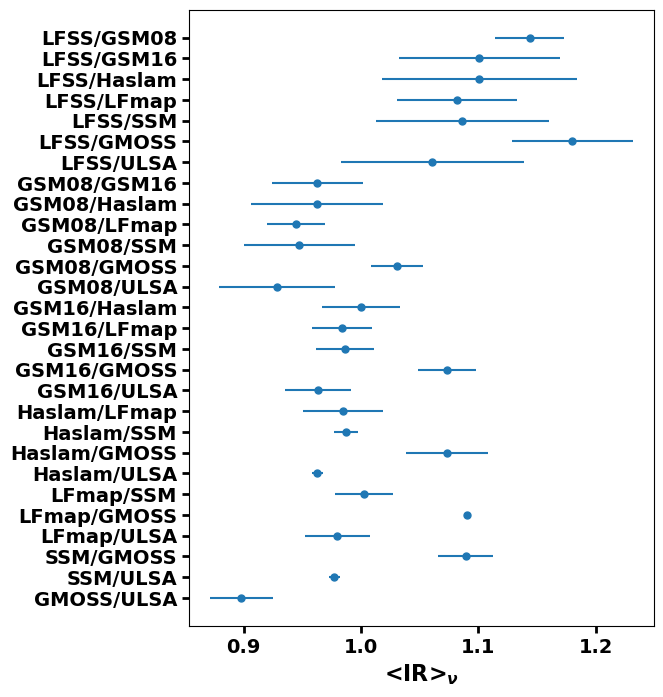

In [18]:
df = compare_DF.copy(deep=True)
df = compare_DF.iloc[::-1,:]
fig, ax = plt.subplots(figsize=(6, 8))
labels = df.index.values
err = df.std(axis=1) / df.mean(axis=1)

pos = range(labels.size)
ax.errorbar(
    df.mean(axis=1), pos, xerr=err, marker=".", linestyle="", markersize=10
)
ax.set_yticks(pos, labels=labels)
ax.set_xlabel("<IR>$_{\\nu}$")

Test1: p0.5=-0.0001195222004182761
Test2: p0.5=0.00011952063739861796
Test3: p0.5+/-0.341=-0.0007281676244693669
1.0112556278139069 0.9287143571785892 1.1198099049524761
Normalization test:  (0.9999996212231103, 7.26571020814859e-06)
Test1: p0.5=-0.0008435959263912718
Test2: p0.5=0.0008435959262110826
Test3: p0.5+/-0.341=0.000880959138852444
0.9892446223111555 0.9167083541770885 1.0692846423211604
Normalization test:  (0.9999996443696912, 5.608808627544093e-06)


(array([0.5       , 0.50050025, 0.5010005 , ..., 1.4989995 , 1.49949975,
        1.5       ]),
 array([-24.95771278, -24.89100805, -24.82440072, ..., -27.47316562,
        -27.54365417, -27.61424088]))

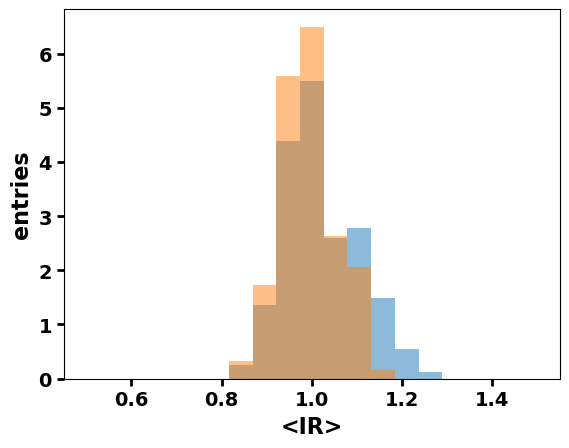

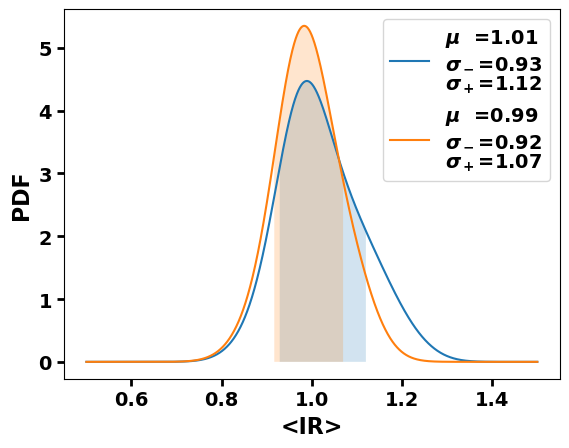

In [19]:
input_data1 = compare_DF.values.flatten()
input_data2 = compare_DF.iloc[7:, :].values.flatten()

bins = np.linspace(0.5, 1.5, 20)
fig, ax = plt.subplots()
fig.suptitle('')
ax.hist(input_data1, bins=bins, density=True, alpha=0.5)
ax.hist(input_data2, bins=bins, density=True, alpha=0.5)

ax.set_xlabel("<IR>")
ax.set_ylabel("entries")


ax.set_xlabel("<IR>")
ax.set_ylabel("entries")

fig = plt.figure()
# fig.suptitle('Blue: all models, Red: without LFSS')
create_KDE_plot(input_data1)
create_KDE_plot(input_data2)


In [20]:
display(input_data1.size)
display(input_data2.size)

308

231

## Local obsever

In [21]:
lst = 18
latitude = -35.206667
frequency_MHz = 45
main_title = "Frequency: {} MHz; Compared on {:.2f}{} angular resolution; LST:{}; Latitude:{:.2f}".format(
    frequency_MHz, np.rad2deg(hp.pixelfunc.nside2resol(new_nside)), chr(176), lst, latitude
)

# Local coordinates at LST time "LSTtime" at latitude "latitude"
rotation_parameters = [(180 + (lst * 15)) % 360, -(latitude - 90)]

In [22]:
# some plot settings
cmap = "jet"
projection_type = "mollweide"

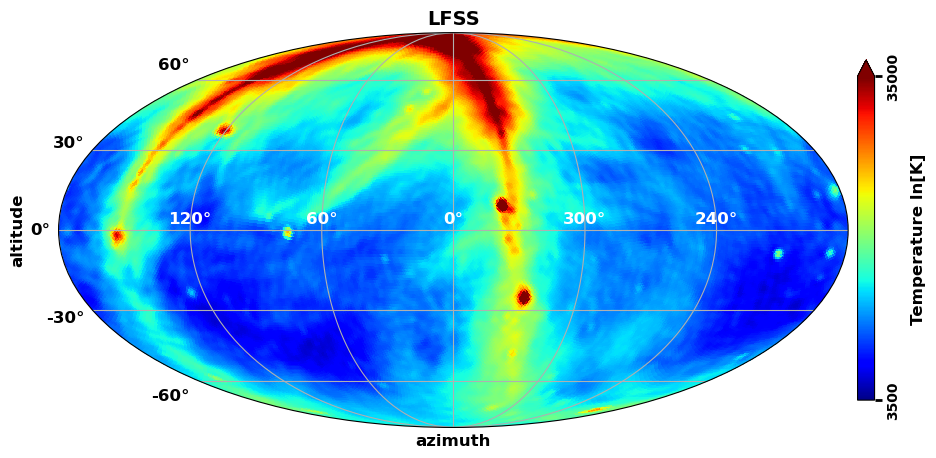

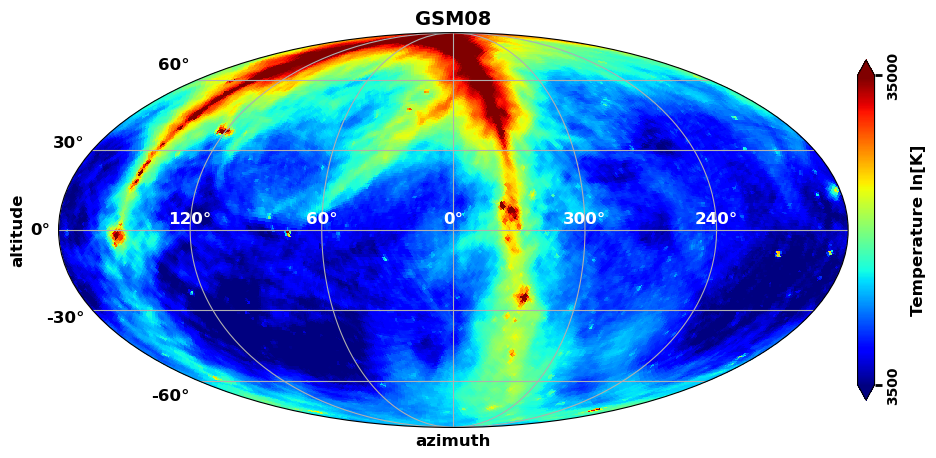

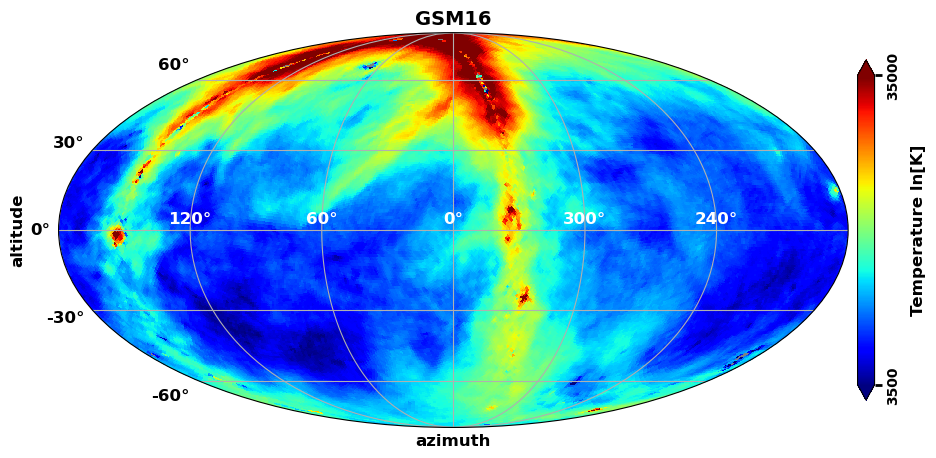

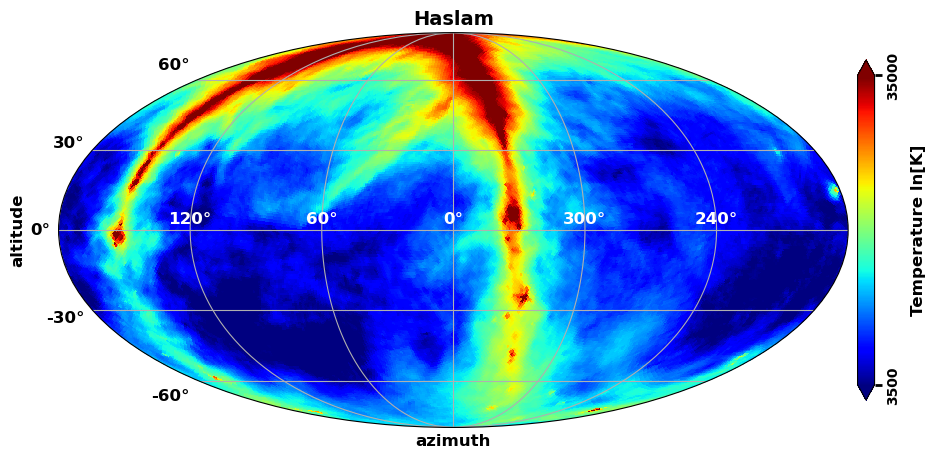

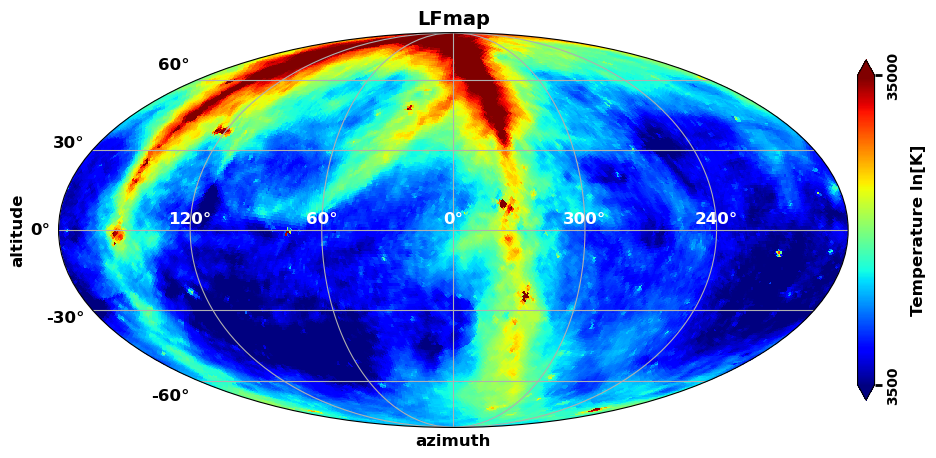

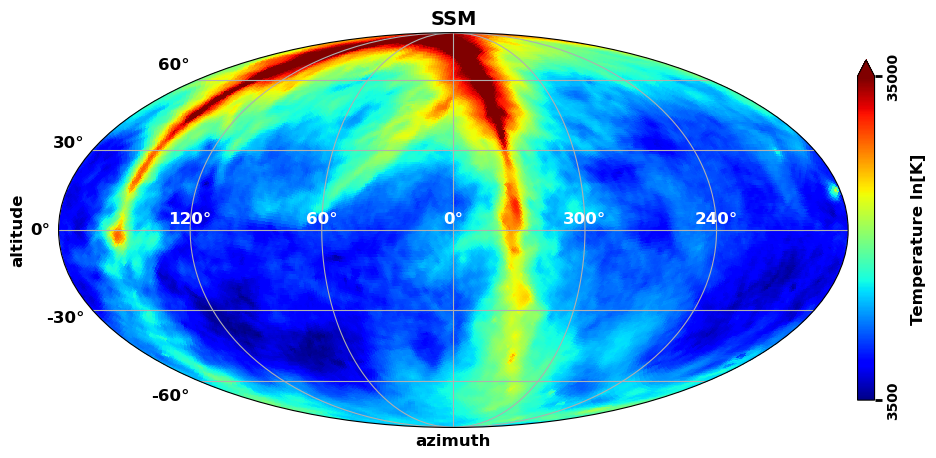

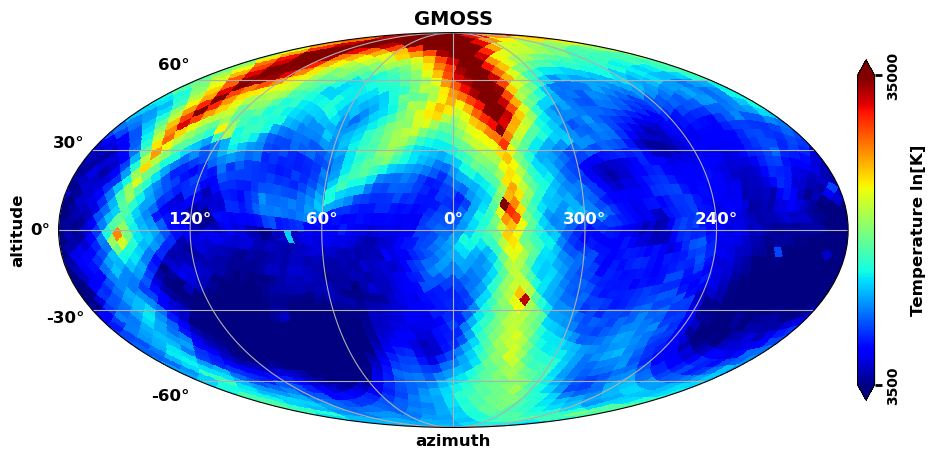

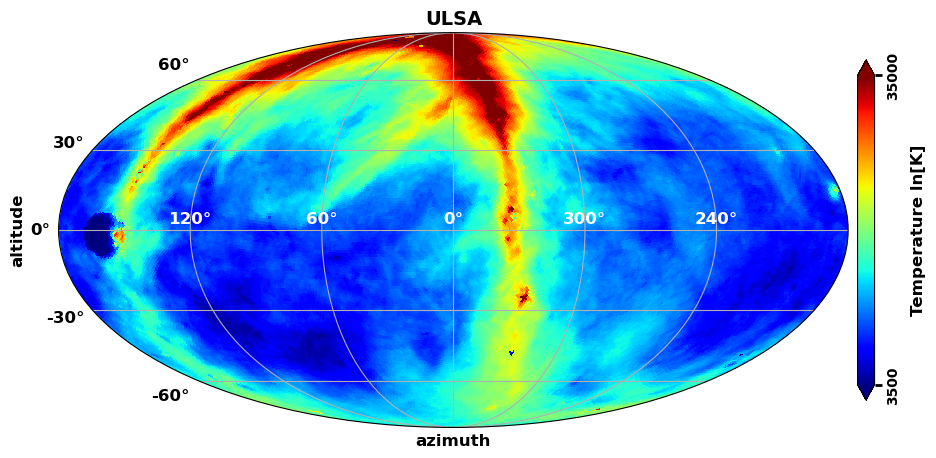

In [23]:
# Prints all maps
for key in map_dict:

    projview(
        map_dict[key],
        norm="log",
        coord=['G','C'],
        rot=rotation_parameters,
        graticule=True,
        graticule_labels=True,
        unit="Temperature ln[K]",
        xlabel="azimuth",
        ylabel="altitude",
        cb_orientation="vertical",
        min=3500,
        max=35000,
        latitude_grid_spacing=30,
        projection_type=projection_type,
        title=key,
        xtick_label_color="white",
        cmap=cmap,
    )

In [24]:
# Create mask, at local coordinates we see only a hemisphere
mask = create_local_mask(new_nside, rotation_parameters)

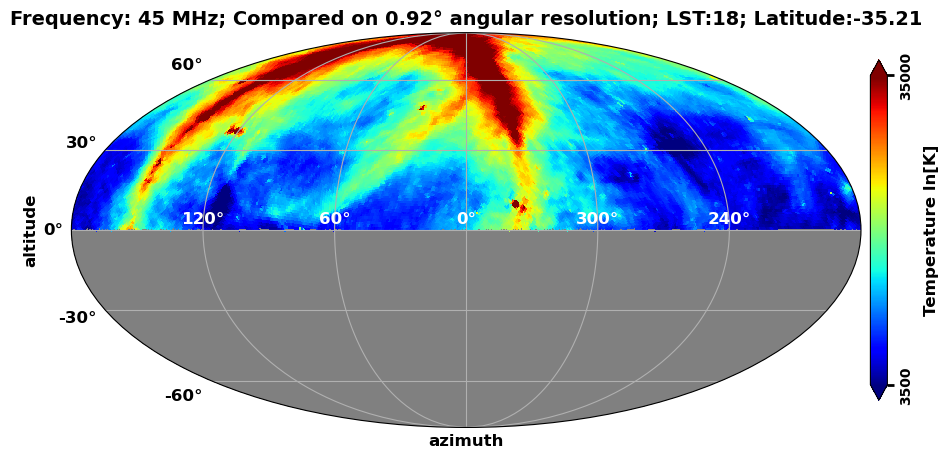

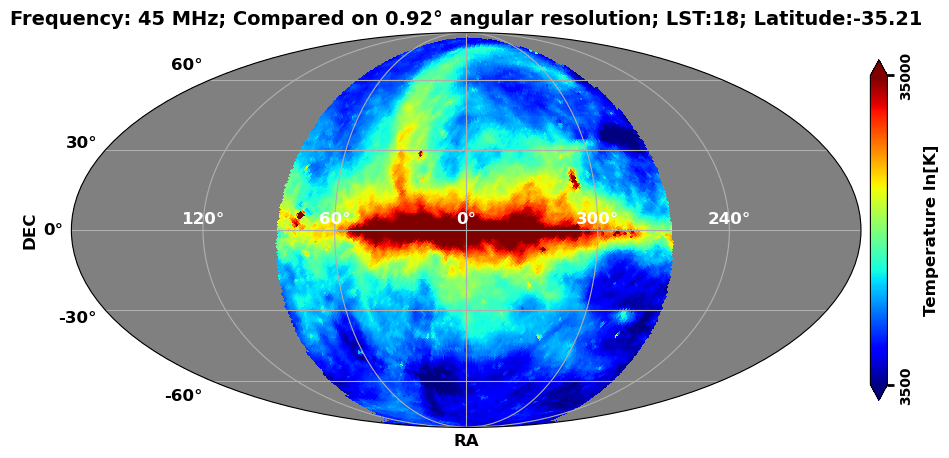

In [25]:
# Test
m = map_dict['LFmap'].copy()
m.mask = mask

projview(
    m,
    norm="log",
    coord=["G", 'C'],
    rot=rotation_parameters,
    graticule=True,
    graticule_labels=True,
    unit="Temperature ln[K]",
    xlabel="azimuth",
    ylabel="altitude",
    cb_orientation="vertical",
    min=3500,
    max=35000,
    latitude_grid_spacing=30,
    xtick_label_color="white",
    title=main_title,
    cmap=cmap,
)

projview(
    m,
    norm="log",
    # coord=["G"],
    # rot=False,
    graticule=True,
    graticule_labels=True,
    unit="Temperature ln[K]",
    xlabel="RA",
    ylabel="DEC",
    cb_orientation="vertical",
    min=3500,
    max=35000,
    latitude_grid_spacing=30,
    xtick_label_color="white",
    title=main_title,
    cmap=cmap,
)

### In local coordinates

{'LFSS/GSM08': [1.07],
 'LFSS/GSM16': [1.02],
 'LFSS/Haslam': [1.0],
 'LFSS/LFmap': [0.99],
 'LFSS/SSM': [1.02],
 'LFSS/GMOSS': [1.09],
 'LFSS/ULSA': [1.02],
 'GSM08/GSM16': [0.95],
 'GSM08/Haslam': [0.94],
 'GSM08/LFmap': [0.93],
 'GSM08/SSM': [0.95],
 'GSM08/GMOSS': [1.02],
 'GSM08/ULSA': [0.95],
 'GSM16/Haslam': [0.98],
 'GSM16/LFmap': [0.97],
 'GSM16/SSM': [1.0],
 'GSM16/GMOSS': [1.07],
 'GSM16/ULSA': [1.0],
 'Haslam/LFmap': [0.99],
 'Haslam/SSM': [1.02],
 'Haslam/GMOSS': [1.09],
 'Haslam/ULSA': [1.01],
 'LFmap/SSM': [1.03],
 'LFmap/GMOSS': [1.1],
 'LFmap/ULSA': [1.02],
 'SSM/GMOSS': [1.07],
 'SSM/ULSA': [1.0],
 'GMOSS/ULSA': [0.93]}

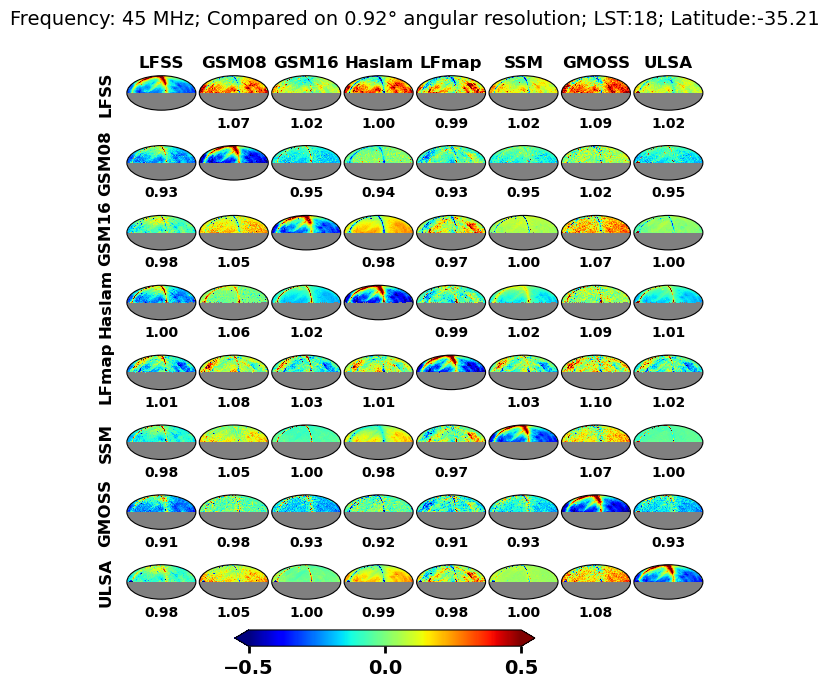

In [26]:
compare_maps(
    map_dict, rotation_parameters=rotation_parameters, coord=['G','C'], main_title=main_title, mask=mask
)

### In galactic coordinates (masked)

{'LFSS/GSM08': [1.07],
 'LFSS/GSM16': [1.02],
 'LFSS/Haslam': [1.0],
 'LFSS/LFmap': [0.99],
 'LFSS/SSM': [1.02],
 'LFSS/GMOSS': [1.09],
 'LFSS/ULSA': [1.02],
 'GSM08/GSM16': [0.95],
 'GSM08/Haslam': [0.94],
 'GSM08/LFmap': [0.93],
 'GSM08/SSM': [0.95],
 'GSM08/GMOSS': [1.02],
 'GSM08/ULSA': [0.95],
 'GSM16/Haslam': [0.98],
 'GSM16/LFmap': [0.97],
 'GSM16/SSM': [1.0],
 'GSM16/GMOSS': [1.07],
 'GSM16/ULSA': [1.0],
 'Haslam/LFmap': [0.99],
 'Haslam/SSM': [1.02],
 'Haslam/GMOSS': [1.09],
 'Haslam/ULSA': [1.01],
 'LFmap/SSM': [1.03],
 'LFmap/GMOSS': [1.1],
 'LFmap/ULSA': [1.02],
 'SSM/GMOSS': [1.07],
 'SSM/ULSA': [1.0],
 'GMOSS/ULSA': [0.93]}

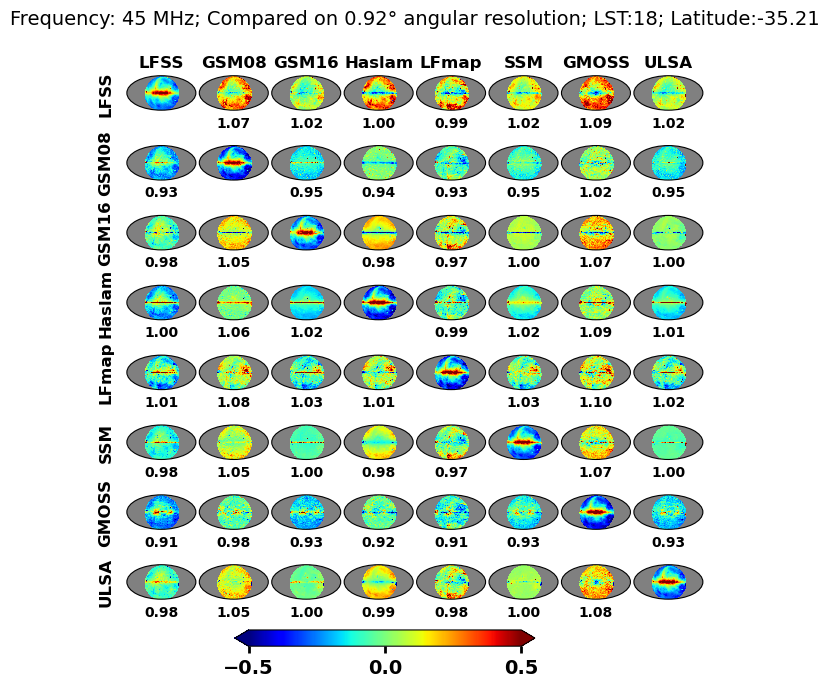

In [27]:
compare_maps(map_dict, rotation_parameters=False, main_title=main_title, mask=mask)

### Complex comparison

In [28]:
f_range = range(30, 85, 5)
lst_range = range(0, 24, 2)
# f_range = range(30, 45, 5)
# lst_range = range(0, 6, 2)
compare_DF = pd.DataFrame(columns=['label', 'frequency [MHz]', 'LST', 'ratio'])

for frequency_MHz in f_range:
    lfmap_map = hp.rotator.Rotator.rotate_map_pixel(
        Rotator(coord=["C", "G"]), lfmap.generate(frequency_MHz)
    )
    lfmap_map = lfmap.generate(frequency_MHz)
    lfss_map = lfss.generate(frequency_MHz)
    gsm2008_map = gsm2008.generate(frequency_MHz)
    gsm2016_map = gsm2016.generate(frequency_MHz)
    haslam_map = haslam.generate(frequency_MHz)
    ssm_map = ssm.generate(frequency_MHz)
    gmoss_map = gmoss.generate(frequency_MHz)
    ulsa_fdi_map = ulsa_fdi.generate(frequency_MHz)
    ulsa_ci_map = ulsa_ci.generate(frequency_MHz)
    ulsa_dpi_map = ulsa_dpi.generate(frequency_MHz)

    # convert to same NSIDE
    new_nside = 64
    lfmap_map_N = hp.ma(hp.pixelfunc.ud_grade(lfmap_map, new_nside))
    lfss_map_N = hp.ma(hp.pixelfunc.ud_grade(lfss_map, new_nside))
    gsm2008_map_N = hp.ma(hp.pixelfunc.ud_grade(gsm2008_map, new_nside))
    gsm2016_map_N = hp.ma(hp.pixelfunc.ud_grade(gsm2016_map, new_nside))
    ssm_map_N = hp.ma(hp.pixelfunc.ud_grade(ssm_map, new_nside))
    haslam_map_N = hp.ma(hp.pixelfunc.ud_grade(haslam_map, new_nside))
    gmoss_map_N = hp.ma(hp.pixelfunc.ud_grade(gmoss_map, new_nside))
    ulsa_fdi_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_fdi_map, new_nside))
    ulsa_ci_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_ci_map, new_nside))
    ulsa_dpi_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_dpi_map, new_nside))

    map_temp_dict = {
        "LFSS": lfss_map_N,
        "GSM08": gsm2008_map_N,
        "GSM16": gsm2016_map_N,
        "Haslam": haslam_map_N,
        "LFmap": lfmap_map_N,
        "SSM": ssm_map_N,
        "GMOSS": gmoss_map_N,
        "ULSA": ulsa_fdi_map_N,
        # "ULSA2": ulsa_ci_map_N,
        # "ULSA3": ulsa_dpi_map_N,
    }
    
    for lst in lst_range:
        rotation_parameters = [(180 + (lst * 15)) % 360, -(latitude - 90)]
        mask = create_local_mask(new_nside, rotation_parameters)

        compare_dict = compare_maps(
            map_temp_dict,
            rotation_parameters=False,
            mask=mask,
            show_plot_comparison=False,
            verbose=False
        )

        for key in compare_dict:
            compare_DF.loc[compare_DF.index.size] = [key, frequency_MHz, lst, compare_dict[key][0]]



[INFO] Outputing map at 30.0 MHz
[INFO] Outputing map at 30.0 MHz


[INFO] Outputing map at 35.0 MHz
[INFO] Outputing map at 35.0 MHz


[INFO] Outputing map at 40.0 MHz
[INFO] Outputing map at 40.0 MHz


[INFO] Outputing map at 45.0 MHz
[INFO] Outputing map at 45.0 MHz


[INFO] Outputing map at 50.0 MHz
[INFO] Outputing map at 50.0 MHz


[INFO] Outputing map at 55.0 MHz
[INFO] Outputing map at 55.0 MHz


[INFO] Outputing map at 60.0 MHz
[INFO] Outputing map at 60.0 MHz


[INFO] Outputing map at 65.0 MHz
[INFO] Outputing map at 65.0 MHz


[INFO] Outputing map at 70.0 MHz
[INFO] Outputing map at 70.0 MHz


[INFO] Outputing map at 75.0 MHz
[INFO] Outputing map at 75.0 MHz


[INFO] Outputing map at 80.0 MHz
[INFO] Outputing map at 80.0 MHz


In [29]:
compare_DF
df = compare_DF.sort_values(by=['label', 'frequency [MHz]', 'LST'])
models_ratio_list = list(dict.fromkeys(df.label.values))

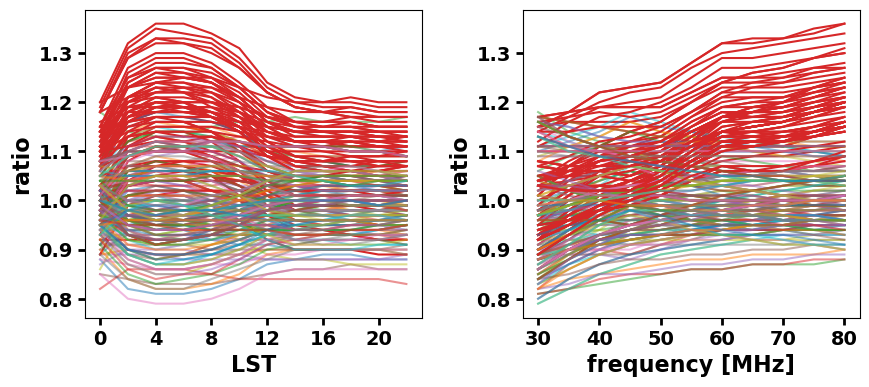

In [30]:
default_color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
# delete red
r = default_color_cycle[3]
del default_color_cycle[3]
b='k'
# b = default_color_cycle[0]
# del default_color_cycle[0]

fig, ax = plt.subplots(1,2, figsize=(10,4))

for i, frequency in enumerate(f_range):
    for models_ratio in models_ratio_list:
        temp = df[(df['label']==models_ratio) & (df['frequency [MHz]']==frequency)]
        if 'LFSS' in models_ratio:
            ax[0].plot(temp.LST.values, temp.ratio.values, c=r, alpha=1)#, zorder=len(f_range)+i)
        elif 'GSM08' in models_ratio:
            ax[0].plot(temp.LST.values, temp.ratio.values, alpha=0.5)#, zorder=len(f_range)+i)
        else:
            ax[0].plot(temp.LST.values, temp.ratio.values, alpha=0.5)

ax[0].set_xlabel('LST')
ax[0].set_ylabel('ratio')

for lst in lst_range:
    for models_ratio in models_ratio_list:
        temp = df[(df['label']==models_ratio) & (df['LST']==lst)]
        if 'LFSS' in models_ratio:
           ax[1].plot(temp['frequency [MHz]'].values, temp.ratio.values, c=r, alpha=1)#, zorder=len(f_range)+i)
        elif 'GSM08' in models_ratio:
           ax[1].plot(temp['frequency [MHz]'].values, temp.ratio.values, alpha=0.5)#, zorder=len(f_range)+i)
        else:
           ax[1].plot(temp['frequency [MHz]'].values, temp.ratio.values, alpha=0.5)

ax[1].set_xlabel('frequency [MHz]')
ax[1].set_ylabel('ratio')
fig.subplots_adjust(wspace=0.3)

ax[0].xaxis.set_major_locator(MultipleLocator(4))
ax[1].xaxis.set_major_locator(MultipleLocator(10))

# Reset to default color cycle
plt.rcParams['axes.prop_cycle'] = plt.rcParamsDefault['axes.prop_cycle']

In [31]:
center_DF = pd.DataFrame()
center_DF.index = lst_range
left_DF = center_DF.copy(deep=True)
right_DF = center_DF.copy(deep=True)

bins=np.linspace(0.5, 1.5, 20)

for frequency in f_range:
    center = []
    left = []
    right = []
    for lst in lst_range:
        data = df[(df['frequency [MHz]'] == frequency) & (df['LST'] == lst)]['ratio'].values

        xax_kde = np.linspace(bins[0], bins[-1], 2000)[:, np.newaxis]
        kde = KernelDensity(kernel="gaussian", bandwidth=0.05).fit(data[:, np.newaxis])
        log_dens = kde.score_samples(xax_kde)

        xax_ = xax_kde.flatten()

        center_i = find_index_on_CDF(log_dens, xax_kde, 0.5)
        left_i = find_index_on_CDF(log_dens, xax_kde, 0.5-0.341)
        right_i = find_index_on_CDF(log_dens, xax_kde, 0.5+0.341)

        center.append(xax_[center_i])
        left.append(xax_[left_i+1])
        right.append(xax_[right_i])
    center_DF[frequency] = center
    left_DF[frequency] = left
    right_DF[frequency] = right


In [32]:
font = "Arial Black"

scene = dict(
    xaxis=dict(
        title="<b>frequency [MHz]</b>",
        color="black",
        tickvals=list(range(len(f_range))),
        ticktext=center_DF.columns.values,
    ),
    yaxis=dict(
        title="<b>LST [hour]</b>",
        color="black",
        tickvals=list(range(len(lst_range))),
        ticktext=center_DF.index.values.tolist(),
    ),
    zaxis=dict(title="<b>average ratio</b>", range=(0.9, 1.05), dtick=0.05),
)

# layout = go.Layout(scene=scene)

fig = go.Figure(
    data=[
        # go.Surface(z=right_DF),
        go.Surface(z=center_DF, showscale=True, opacity=0.9)
    ],
    # go.Surface(z=left_DF, showscale=False, opacity=0.9)],
)

fig.update_layout(
    scene=scene,
    margin=dict(r=20, b=10, l=10, t=10),
    height=600,
    autosize=False,
    font=dict(
        family=font,
        size=15,
        color='black'
    ),
)
fig.show()

fig = go.Figure(
    data=[
        go.Surface(z=(center_DF - right_DF).abs(), opacity=0.5),
        # go.Surface(z=center_DF, showscale=False, opacity=0.9)],
        go.Surface(z=(center_DF - left_DF).abs(), showscale=False, opacity=0.5),
    ],
)


scene["zaxis"] = {"title": "<b>average ratio error</b>", "dtick": 0.05}
fig.update_layout(
    scene=scene,
    margin=dict(r=20, b=10, l=10, t=10),
    height=600,
    autosize=False,
    font=dict(
        family=font,
        size=15,
        color='black'
    ),
)

fig.update_coloraxes(colorbar=dict(tickprefix="<b>",ticksuffix ="</b>",  tickfont=dict(size=1)))
fig.show()

Test1: p0.5=0.0002794558929617441
Test2: p0.5=-0.00028223376729313854
Test3: p0.5+/-0.341=8.582093193232332e-05
1.0117558779389695 0.923711855927964 1.1243121560780391


Text(0, 0.5, 'CDF')

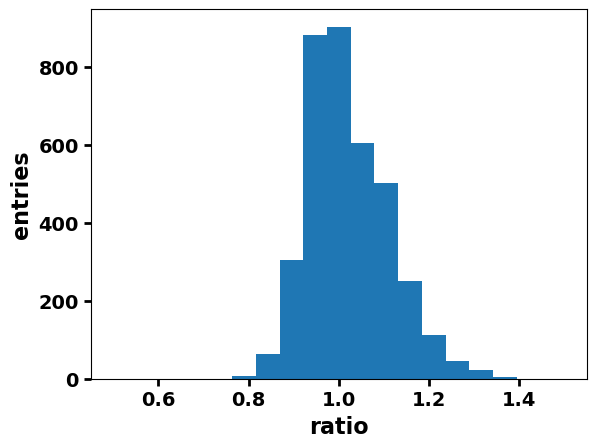

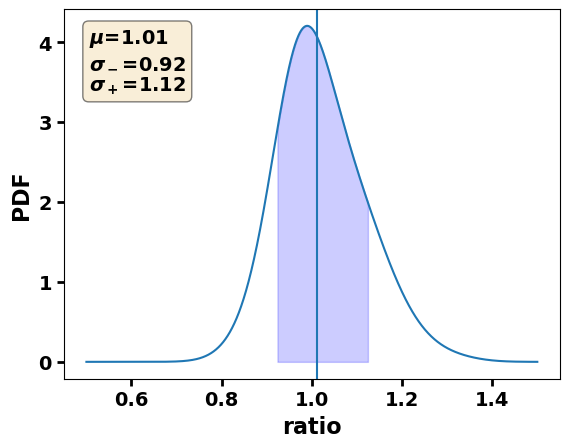

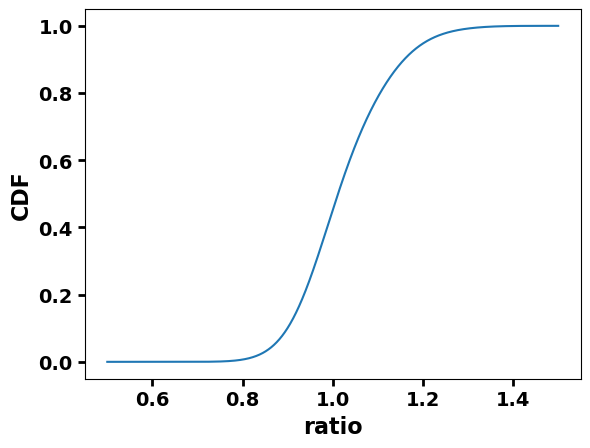

In [33]:
input_data = df.ratio.values
# input_data = df[(df['frequency [MHz]'] >45) & (df['frequency [MHz]'] <999)  & ((df['LST'] >=0) | (df['LST'] <=777))].ratio.values
input_data = df[(df['frequency [MHz]'] >0) & (df['frequency [MHz]'] <99)].ratio.values

########################################
fig, ax = plt.subplots()

bins=np.linspace(0.5, 1.5, 20)
hist_data = ax.hist(input_data, bins=bins)

xax_kde = np.linspace(bins[0], bins[-1], 2000)[:, np.newaxis]
kde = KernelDensity(kernel="gaussian", bandwidth=0.05).fit(input_data[:, np.newaxis])
log_dens = kde.score_samples(xax_kde)

ax.set_xlabel('ratio')
ax.set_ylabel('entries')
########################################

fig, ax = plt.subplots()

xax_ = xax_kde.flatten()
ax.plot(xax_, np.exp(log_dens))

center_i = find_index_on_CDF(log_dens, xax_kde, 0.5)
left_i = find_index_on_CDF(log_dens, xax_kde, 0.5-0.341)
right_i = find_index_on_CDF(log_dens, xax_kde, 0.5+0.341)

print('Test1: p0.5={}'.format(np.sum(np.exp(log_dens[:center_i+1])*np.diff(xax_)[0]) - 0.5))
print('Test2: p0.5={}'.format(np.sum(np.exp(log_dens[center_i+1:])*np.diff(xax_)[0]) - 0.5))
print('Test3: p0.5+/-0.341={}'.format(np.sum(np.exp(log_dens[left_i+1:right_i+1])*np.diff(xax_)[0]) - 2*0.341))
print(xax_[center_i], xax_[left_i+1], xax_[right_i])

ax.fill_between(
        x= xax_, 
        y1=  np.exp(log_dens), 
        where= (xax_ >= xax_[left_i+1]) & (xax_ < xax_[right_i+1]),
        color= "b",
        alpha= 0.2)

ax.axes.axvline(xax_[center_i])      
ax.set_xlabel('ratio')
ax.set_ylabel('PDF')

textstr = '\n'.join((
    r'$\mu$={:.2f}'.format(xax_[center_i]),
    r'$\sigma_-$={:.2f}'.format(xax_[left_i+1]),
    r'$\sigma_+$={:.2f}'.format(xax_[right_i+1])))

props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

############################
fig, ax = plt.subplots()

ax.plot(xax_, np.cumsum(np.exp(log_dens)*np.diff(xax_)[0]))

ax.set_xlabel('ratio')
ax.set_ylabel('CDF')

Test1: p0.5=0.0002794558929617441
Test2: p0.5=-0.00028223376729313854
Test3: p0.5+/-0.341=8.582093193232332e-05
1.0117558779389695 0.923711855927964 1.1243121560780391
Normalization test:  (0.9999458783813944, 1.0222836135387325e-06)


Test1: p0.5=0.0010215842694417665
Test2: p0.5=-0.0010215842731487457
Test3: p0.5+/-0.341=0.0004973617251978757
0.9892446223111555 0.9112056028014006 1.0747873936968484
Normalization test:  (0.9999996016922741, 2.7997680946967307e-06)


(array([0.5       , 0.50050025, 0.5010005 , ..., 1.4989995 , 1.49949975,
        1.5       ]),
 array([-21.54579454, -21.48654284, -21.42738644, ..., -24.6263996 ,
        -24.6921186 , -24.75793368]))

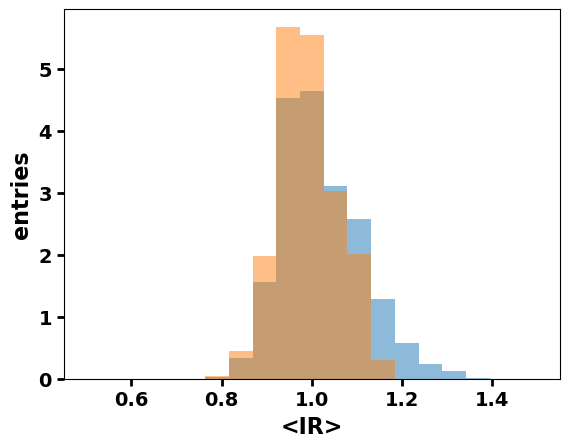

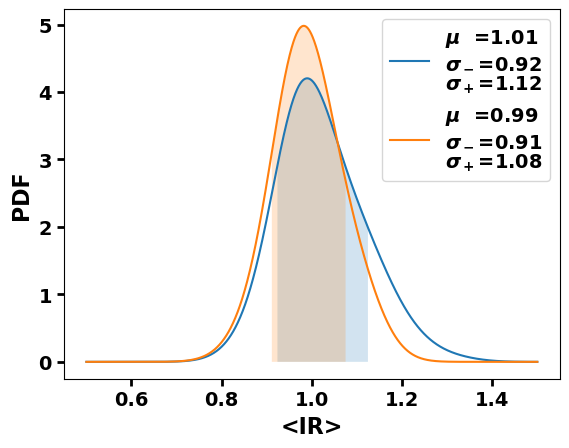

In [34]:
input_data1 = df.ratio.values
input_data2 = df[[False if 'LFSS' in s else True for s in df.label.values]].ratio.values

fig, ax = plt.subplots()
fig.suptitle('')
ax.hist(input_data1, bins=bins, density=True, alpha=0.5)
ax.hist(input_data2, bins=bins, density=True, alpha=0.5)

ax.set_xlabel("<IR>")
ax.set_ylabel("entries")


ax.set_xlabel("<IR>")
ax.set_ylabel("entries")

fig = plt.figure()
# fig.suptitle('Blue: all models, Red: without LFSS')
create_KDE_plot(input_data1)
create_KDE_plot(input_data2)

